In [3]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
  Using cached pillow-11.3.0-cp313-cp313-win_amd64.whl.metadata (9.2 kB)
  Using cached werkzeug-3.1.3-py3-none-any.whl.metadata (3.7 kB)
   ---------------------------------------- 0.0/332.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/332.0 MB ? eta -:--:--
   ---------------------------------------- 0.8/332.0 MB 3.0 MB/s eta 0:01:50
   ---------------------------------------- 1.3/332.0 MB 3.1 MB/s eta 0:01:47
   ---------------------------------------- 2.1/332.0 MB 3.1 MB/s eta 0:01:47
   ---------------------------------------- 2.9/332.0 MB 3.4 MB/s eta 0:01:38
   ---------------------------------------- 3.9/332.0 MB 3.5 MB/s eta 0:01:35
    --------------------------------------- 4.5/332.0 MB 3.5 MB/s eta 0:01:34
    --------------------------------------- 5.5/332.0 MB 3.6 MB/s eta 0:01:32
    --------------------------------------- 6.3/332.0 MB 3.6 MB/s eta 0:01:31
    --------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
!pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/8.1 MB ? eta -:--:--
   - -------------------------------------- 0.3/8.1 MB ? eta -:--:--
   -- ------------------------------------- 0.5/8.1 MB 1.7 MB/s eta 0:00:05
   ----- ---------------------------------- 1.0/8.1 MB 1.8 MB/s eta 0:00:04
   ------- -------------------------------- 1.6/8.1 MB 2.0 MB/s eta 0:00:04
   ---------- ----------------------------- 2.1/8.1 MB 2.1 MB/s eta 0:00:03
   ------------ --------------------------- 2.6/8.1 MB 2.2 MB/s eta 0:00:03
   --------------- ------------------------ 3.1/8.1 MB 2.3 MB/s eta 0:00:03
   ------------------- -------------------- 3.9/8.1 MB 2.4 MB/s eta 0:00:02
   ----------------------- ---------------- 4.7/8.1 MB 2.6 MB/s eta 0:00:02
   --------------------------- ------------ 5.5/8.1 MB 2.7 MB/s eta 0:00:01
   -------------------------------- ------- 6.6/8.1 MB 2.9 MB/s eta 0:00:01
   ---------------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.

[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import mnist
import matplotlib.pyplot as plt


In [7]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 50

In [12]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    'PlantVillage',
    batch_size=BATCH_SIZE,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    shuffle=True

)

Found 2152 files belonging to 3 classes.


In [13]:
dataset_classNames = dataset.class_names
print(dataset_classNames)

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']


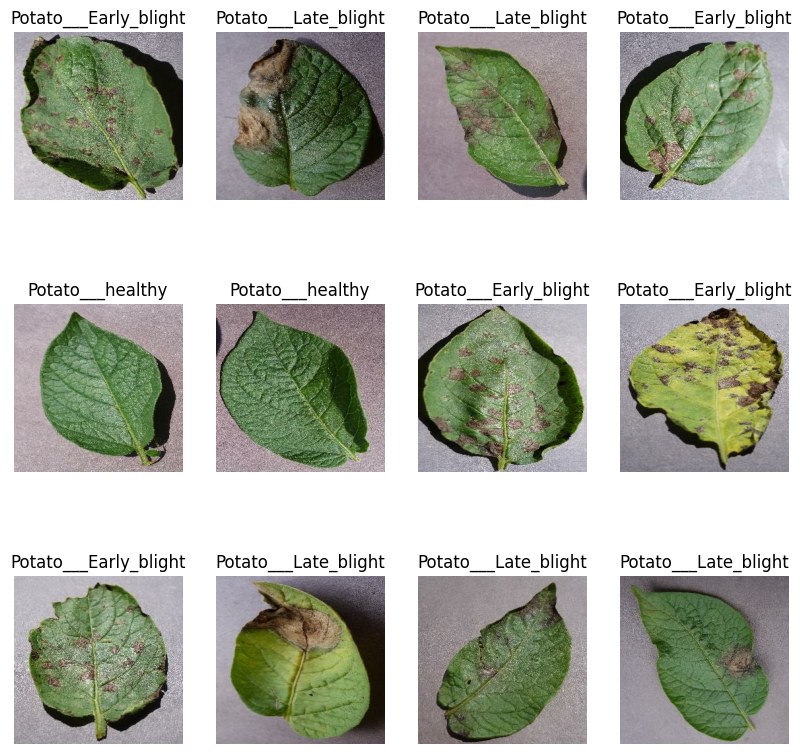

In [17]:
plt.figure(figsize=(10,10))
for image_batch , label_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(dataset_classNames[label_batch[i]])
        plt.axis('off')

In [18]:
#We use 80% for training 
# 20% ==> 10% fro validation, 10% for testing

train_size = 0.8

len(dataset)*train_size

54.400000000000006

In [22]:
tarin_dataset = dataset.take(54)
len(tarin_dataset)

54

In [21]:
test_dataset = dataset.skip(54)

In [23]:
len(test_dataset)

14

In [24]:
val_size = 0.1
len(dataset)*val_size

6.800000000000001

In [25]:
val_dataset = test_dataset.take(6)

In [26]:
test_dataset = test_dataset.skip(6)

In [31]:
def get_dataset_partition(ds , train_split=0.8 , test_split=0.1, val_split=0.1, shuffle=True , shuffle_size =10000):
    ds_size = len(dataset)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
   
    val_ds = ds.skip(train_size).take(val_size)
    
    test_ds = ds.skip(train_size).skip(val_size)
    

    return train_ds , test_ds, val_ds
    

In [32]:
train_ds , test_ds , val_ds =get_dataset_partition(dataset)

In [33]:
len(train_ds)

54

In [34]:
len(val_ds)

6

In [35]:
len(test_ds)

8

In [36]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [54]:
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.Rescaling(1.0/255),
])


In [55]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
])

In [56]:
model = tf.keras.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(filters=16 , kernel_size=3 , padding='same', activation='relu'),
    layers.MaxPool2D(2),
    
    layers.Conv2D(filters=32 , kernel_size=3 , padding='same', activation='relu'),
    layers.MaxPool2D(2),

    layers.Conv2D(filters=64 , kernel_size=3 , padding='same', activation='relu'),
    layers.MaxPool2D(2),

    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPool2D(2),

    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPool2D(2),

    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPool2D(2),
   
    layers.Dropout(0.3),
    
    layers.Flatten(),
    
    layers.Dense(128, activation='relu'),
    layers.Dense(3, activation='softmax')
])


In [59]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)
model.summary()


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential_12 (Sequential)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_13 (Sequential)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_48 (Conv2D)                   │ (None, 256, 256, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_48 (MaxPooling2D)      │ (None, 128, 128, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 128, 128, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_49 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_50 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_51 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_51 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_52 (Conv2D)                   │ (None, 16, 16, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_52 (MaxPooling2D)      │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_53 (Conv2D)                   │ (None, 8, 8, 32)            │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_53 (MaxPooling2D)      │ (None, 4, 4, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 4, 4, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_8 (Flatten)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 128)                 │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 3)                   │             387 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 255,747 (999.01 KB)

 Trainable params: 255,747 (999.01 KB)

 Non-trainable params: 0 (0.00 B)

In [62]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# 1️⃣ Stop early if no improvement in val_loss after 5 epochs
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# 2️⃣ Save the best model
checkpoint = ModelCheckpoint(
    'best_model.h5',
    monitor='val_loss',
    save_best_only=True
)

# 3️⃣ Reduce learning rate when val_loss plateaus
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-6
)

callbacks = [early_stop, checkpoint, reduce_lr]

# Assuming you have train_dataset and val_dataset
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    callbacks=callbacks
)


Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - accuracy: 0.7990 - loss: 0.5790

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 572ms/step - accuracy: 0.8032 - loss: 0.5489 - val_accuracy: 0.8490 - val_loss: 0.4352 - learning_rate: 0.0010
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 570ms/step - accuracy: 0.8553 - loss: 0.4026 - val_accuracy: 0.7031 - val_loss: 0.9660 - learning_rate: 0.0010
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 571ms/step - accuracy: 0.8715 - loss: 0.3575 - val_accuracy: 0.7917 - val_loss: 0.5152 - learning_rate: 0.0010
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - accuracy: 0.8896 - loss: 0.3227

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 572ms/step - accuracy: 0.8900 - loss: 0.3016 - val_accuracy: 0.8698 - val_loss: 0.3126 - learning_rate: 0.0010
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - accuracy: 0.9041 - loss: 0.2603

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 576ms/step - accuracy: 0.8958 - loss: 0.2730 - val_accuracy: 0.9271 - val_loss: 0.2111 - learning_rate: 0.0010
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 573ms/step - accuracy: 0.9346 - loss: 0.1759 - val_accuracy: 0.8125 - val_loss: 0.4630 - learning_rate: 0.0010
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 575ms/step - accuracy: 0.9184 - loss: 0.2214 - val_accuracy: 0.6250 - val_loss: 0.9746 - learning_rate: 0.0010
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.8894 - loss: 0.3149

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 573ms/step - accuracy: 0.9086 - loss: 0.2616 - val_accuracy: 0.9427 - val_loss: 0.1687 - learning_rate: 0.0010
Epoch 9/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - accuracy: 0.9409 - loss: 0.1572

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 582ms/step - accuracy: 0.9525 - loss: 0.1293 - val_accuracy: 0.9479 - val_loss: 0.1068 - learning_rate: 0.0010
Epoch 10/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 572ms/step - accuracy: 0.9421 - loss: 0.1408 - val_accuracy: 0.9323 - val_loss: 0.1634 - learning_rate: 0.0010
Epoch 11/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - accuracy: 0.9603 - loss: 0.1146

54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 580ms/step - accuracy: 0.9549 - loss: 0.1205 - val_accuracy: 0.9635 - val_loss: 0.0667 - learning_rate: 0.0010
Epoch 12/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 574ms/step - accuracy: 0.9485 - loss: 0.1412 - val_accuracy: 0.9583 - val_loss: 0.1604 - learning_rate: 0.0010
Epoch 13/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 577ms/step - accuracy: 0.9439 - loss: 0.1491 - val_accuracy: 0.8802 - val_loss: 0.2408 - learning_rate: 0.0010
Epoch 14/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 573ms/step - accuracy: 0.9485 - loss: 0.1326 - val_accuracy: 0.9688 - val_loss: 0.1313 - learning_rate: 0.0010
Epoch 15/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 578ms/step - accuracy: 0.9427 - loss: 0.1510 - val_accuracy: 0.9531 - val_loss: 0.1615 - learning_rate: 5.0000e-04
Epoch 16/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 31s 574ms/step - accuracy: 0.9745 - loss: 0.0739 - val_accuracy: 0.9635 - val_loss: 0.1005 - learning_rate: 5.0000e-04


In [64]:
model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.9727 - loss: 0.0525


[0.05254592001438141, 0.97265625]

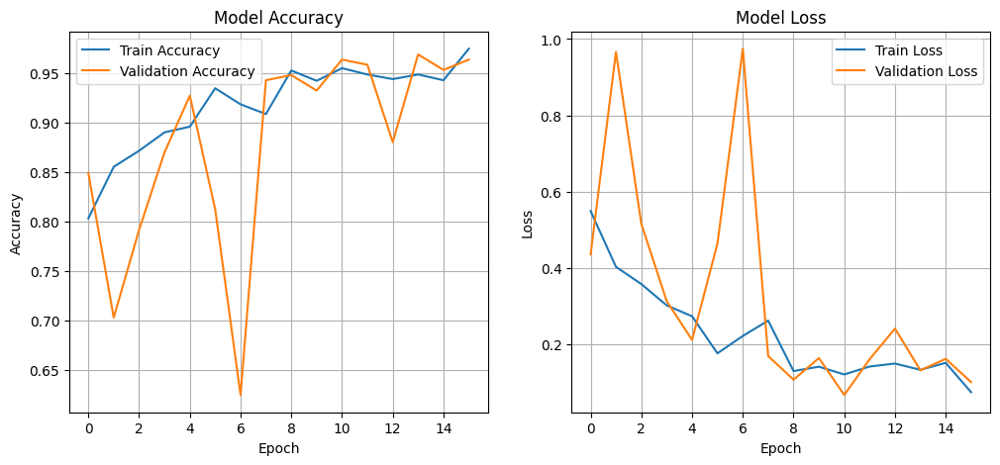

In [63]:
import matplotlib.pyplot as plt

# Assuming you stored the history from model.fit
# history = model.fit(...)

# Plot Accuracy
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.show()


In [65]:
import numpy as np

first image to predict is
actul label is :  Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
prediction label is :  Potato___Early_blight


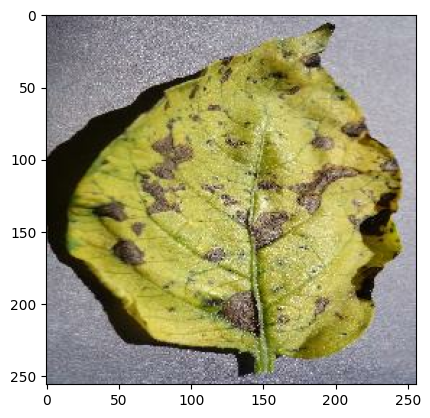

In [82]:
for images_batch,labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    print('first image to predict is')
    plt.imshow(first_image)

    print('actul label is : ',dataset_classNames[first_label])

    batch_predction = model.predict(images_batch)
    print('prediction label is : ', dataset_classNames[np.argmax(batch_predction[0])])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


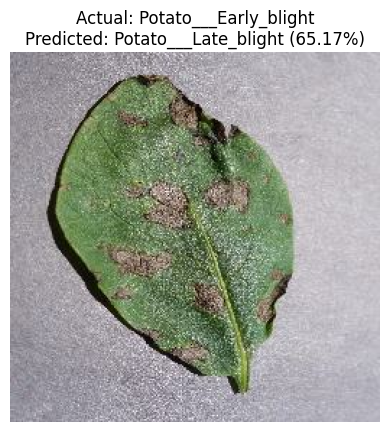

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


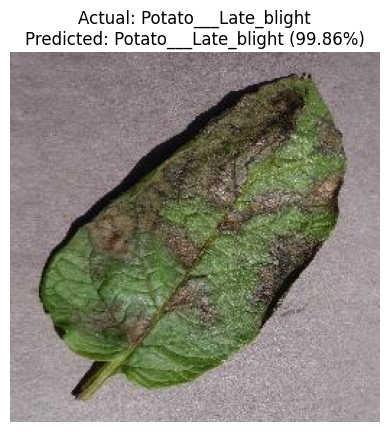

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


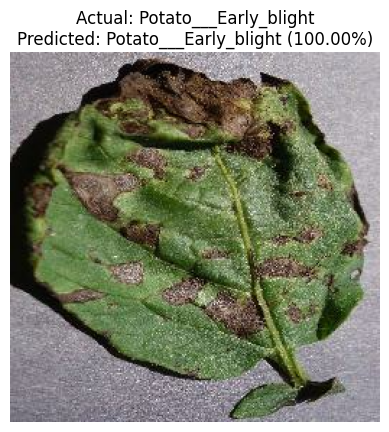

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


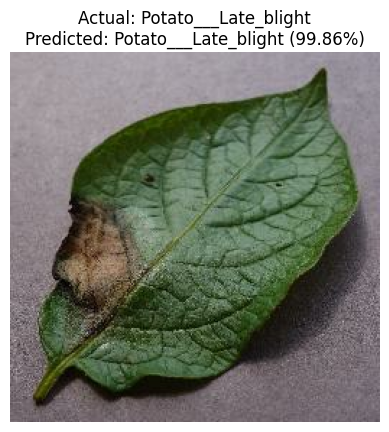

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


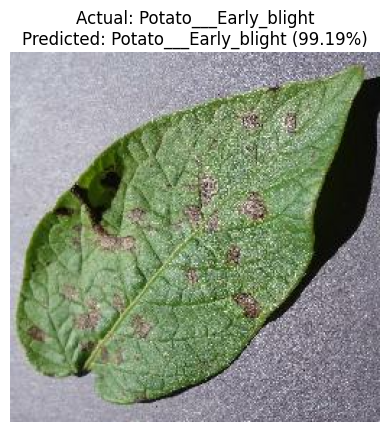

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


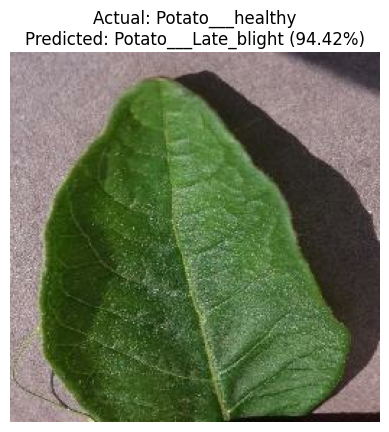

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


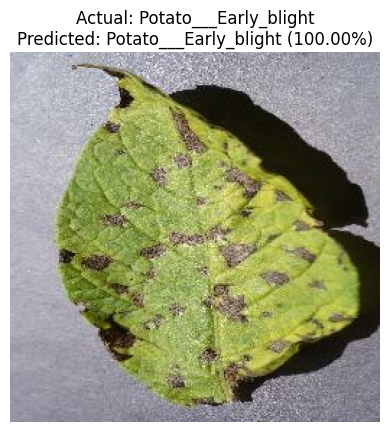

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


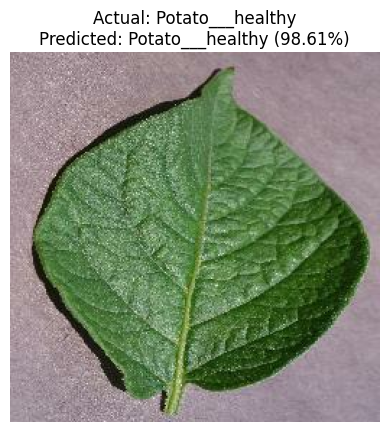

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


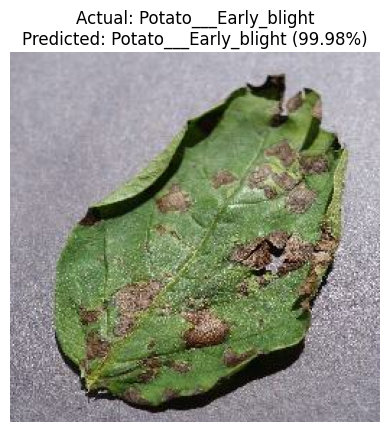

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


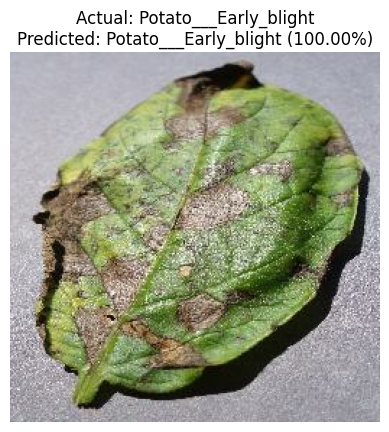

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


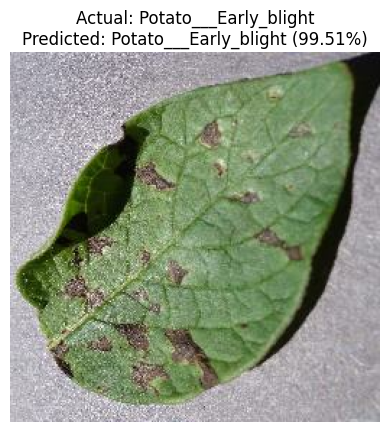

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


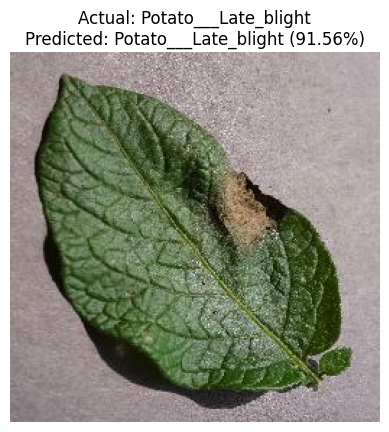

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


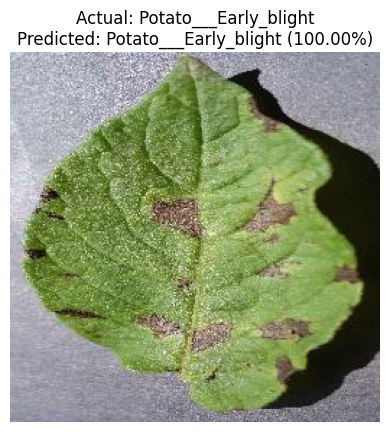

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


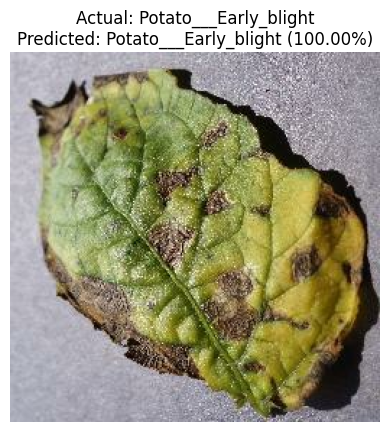

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


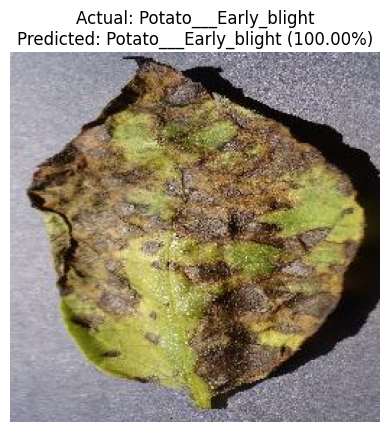

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


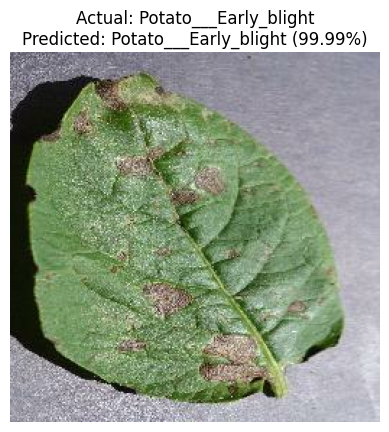

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


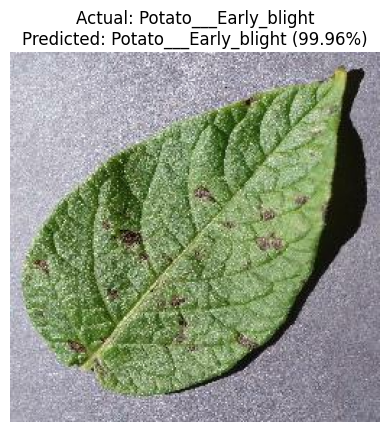

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


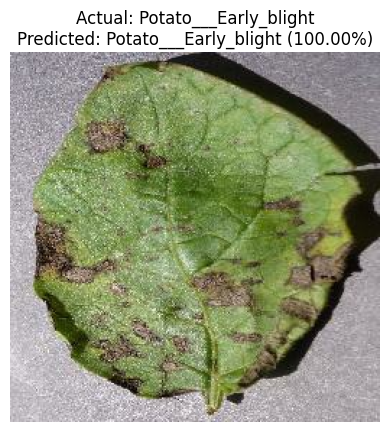

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


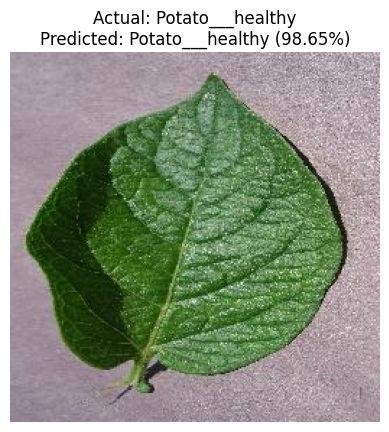

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


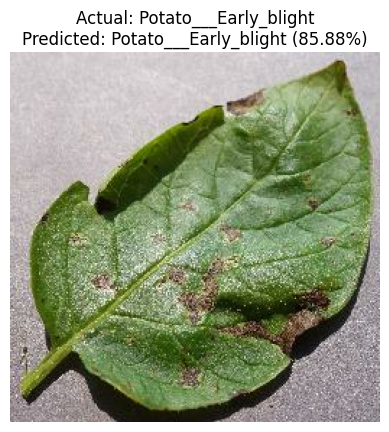

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


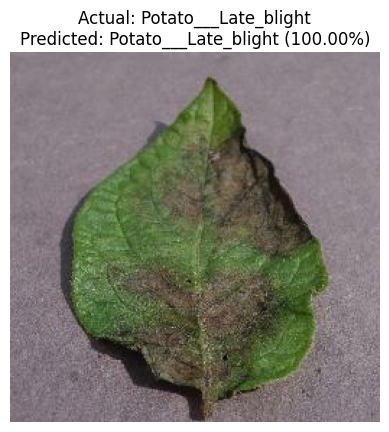

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


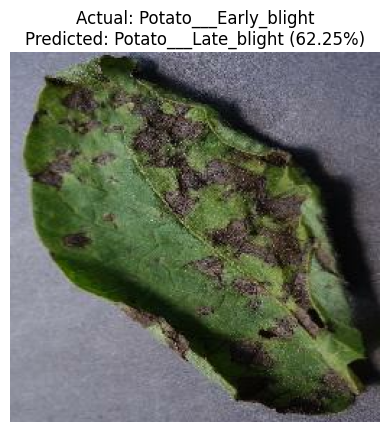

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


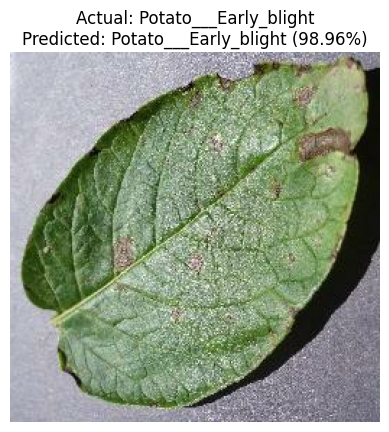

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


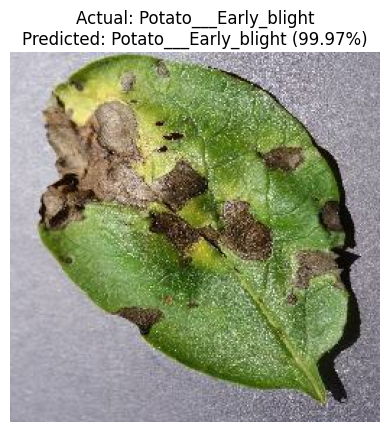

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


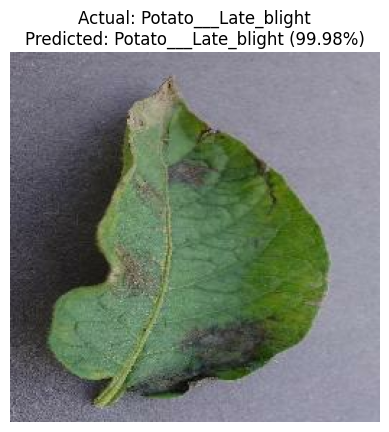

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


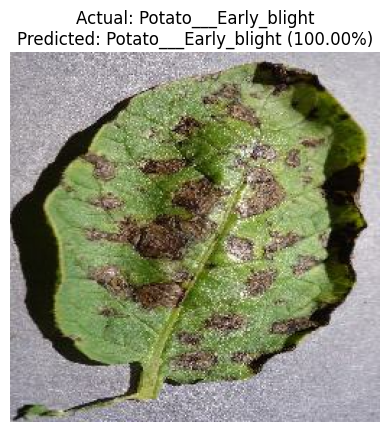

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


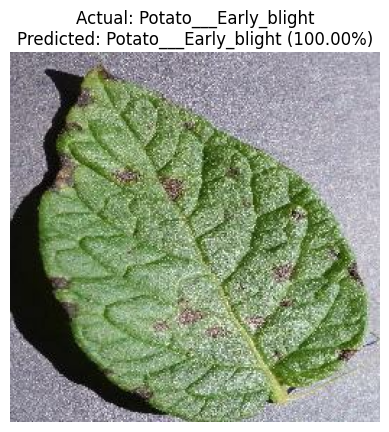

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


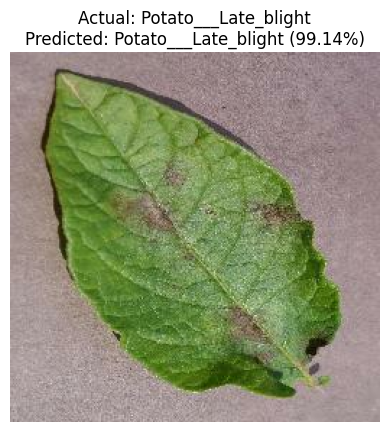

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


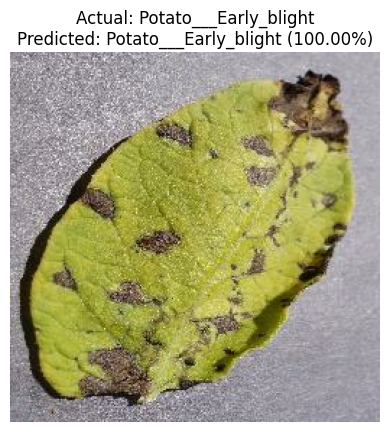

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


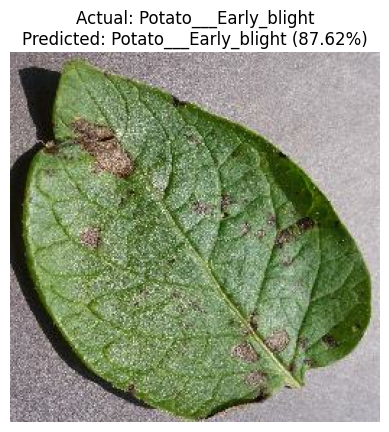

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


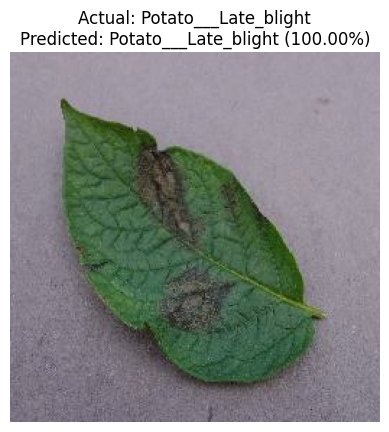

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


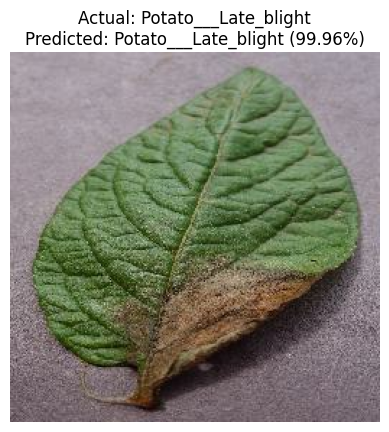

In [86]:

# Take one batch from your test dataset
for images_batch, labels_batch in test_ds.take(1):
    
    # Loop through the batch
    for i in range(len(images_batch)):
        image = images_batch[i].numpy().astype('uint8')
        true_label = labels_batch[i].numpy()
        
        # Model prediction
        prediction = model.predict(images_batch[i:i+1])  # keep batch dimension
        predicted_label = np.argmax(prediction[0])
        confidence = np.max(prediction[0])  # highest probability
        
        # Display image
        plt.figure()
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Actual: {dataset_classNames[true_label]}\n"
                  f"Predicted: {dataset_classNames[predicted_label]} ({confidence*100:.2f}%)")
        plt.show()

In [90]:
model_vesrion = 1
model.save(f"../models/{model_vesrion}.keras")